# Fast Moving Consumer Goods Sales Forecast - Part II

## Setting Up the Workspace

In [1]:
# Install packages
#!pip install pandas
!pip install dtreeviz

In [2]:
# Import packages
import dtreeviz

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np 
import seaborn as sns 
#import statsmodels.api as sm # --USED IN SCM.254 MODULE "ADVANCED REGRESSION"

# Import required sklearn modules --------
# Split X and y into training and testing sets
from sklearn.model_selection import train_test_split

# Import the model class
#from sklearn.linear_model import LogisticRegression # --USED IN SCM.254 MODULE "ADVANCED REGRESSION"
from sklearn import tree
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import DecisionTreeClassifier

from sklearn.ensemble import RandomForestRegressor 
from sklearn.ensemble import RandomForestClassifier 

# Import the metrics class
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.metrics import mean_absolute_error 



## Loading the Data

In [3]:
# Load data
walmart_file_path = 'https://www.dropbox.com/s/ns7envvzoqyypui/Walmart_Store_sales.csv?dl=1'
walmart_data = pd.read_csv(walmart_file_path) 

# Filter rows with missing values
filtered_walmart_data = walmart_data.dropna(axis=0)

# Choose target and features
y = filtered_walmart_data.Weekly_Sales
walmart_features = ['Fuel_Price', 'Unemployment', 'CPI', 'Temperature', 'Holiday_Flag']
X = filtered_walmart_data[walmart_features]

# Split data into training and validation data, for both features and target
# The split is based on a random number generator. 
# Supplying a numeric value to the random_state argument guarantees we get the same split every time we run this script.
train_X, val_X, train_y, val_y = train_test_split(X, y,random_state = 0)

# RECAP: Fast Moving Consumer Goods Sales Forecast - Part I

# 1. Introduction to Decision Trees

We use data to decide how to break the FMCG sales data into two groups, and then again to determine the predicted revenue in each group. In this example we predict the sales of week with or without a holiday. This step of capturing patterns from data is called **fitting** or **training** the model. The data used to **fit** the model is called the **training data**.  

After the model has been fit, you can apply it to new data to **predict** weekly sales in the future.

## Improving the Decision Tree

You can capture more factors using a tree that has more "splits." These are called "deeper" trees. You predict the sales of any week by tracing through the decision tree, always picking the path corresponding to that characteristics of that week. The predicted price for that week is at the bottom of the tree.  The point at the bottom where we make a prediction is called a **leaf.**   

The splits and values at the leaves will be determined by the data.

# 2. Using Pandas to Get Familiar With Your Data

The first step in any machine learning project is familiarize yourself with the data. We use the Pandas library for this. The most important part of the Pandas library is the DataFrame.  A DataFrame holds the type of data you might think of as a table. This is similar to a sheet in Excel, or a table in a SQL database. 

## Interpreting Data Description

* **count** shows how many rows have non-missing values. 
* **mean** is the average, and **std** is the standard deviation which measures how numerically spread out the values are.
* **min** and **max** are respectively the minimum and maximum values.
* **25%**, **50%**, **75%** are respectively the 25th, 50th, 75th percentiles. 

Imagine sorting each column from lowest to highest value. The first (smallest) value is the minimum value. If you go a quarter way through the list, you'll find a number that is bigger than 25% of the values and smaller than 75% of the values. That is the 25th percentile.  The 50th and 75th percentiles are defined analogously, and the maximum value is the largest number.

# 3. Selecting Data for Modeling

The **columns** property of the DataFrame shows a list of all columns in the dataset.

## Selecting the Prediction Target 

We use **dot-notation** to select a single column of data that we want to predict, called the **prediction target**. By convention, the prediction target is called **y**. A small (lowercase) letter is used to remind ourselves that this selection is only a single column.

## Choosing Features

We use a **column list** to select **multiple features** to determine the target variable by providing a list of column names inside brackets. Each item (column name) in that list should be a string, indicated with quotes. By convention, this selection of features is called **X**. A capital (uppercase) letter is used to remind ourselves that this selection is in fact a *matrix* formed by multiple columns.

Visually checking data is an important part of a data scientist's job. There may surprises in the dataset that deserve further inspection.

#  4. Building Your Model

Scikit-learn is a popular library for modeling the types of data typically stored in DataFrames. 

The steps to building and using a model are:
* **Define** - What type of model will it be? Some parameters of the model type may be specified too.
* **Fit** - Capture patterns from provided data. This is the heart of modeling.
* **Predict** - The fitted model is used to make predictions.
* **Evaluate** - Determine how accurate the model's predictions are.

Many machine learning models allow randomness in model training. Specifying a number for `random_state` ensures you get the same results in each run. You use any number, and model quality won't depend meaningfully on exactly what value you choose.


# 5. What is Model Validation

Measuring model quality is the key to iteratively improving your models.
* **Mean Absolute Error** (MAE)
* **Mean Absolute Percentage Error** (MAPE)
* **Mean Squared Error** (MSE)
* **Root Mean Squared Error*** (RMSE)

## The Problem with In-Sample Scores

Since models' practical value come from making predictions on new data, we measure performance on data that wasn't used to build the model. A straightforward way to do this is to exclude some data from the model-building process, and then use the excluded data to test the model's accuracy on data it hasn't seen before. This data is called **validation data**.

## Coding the Train-Test Split

The scikit-learn library has a function `train_test_split` to break up the data into two pieces. We'll use some of that data as training data to fit the model, and we'll use the other data as validation data to calculate `mean_absolute_error`.

There are many ways to improve this model, such as experimenting to find better features or different model types.

*In today's class, you will learn concepts of **underfitting** and **overfitting**, and you will be able to apply these ideas to make your models more accurate.*

---
# Fast Moving Consumer Goods Sales Forecast - Part II

# 6. Experimenting With Different Models

Now that you have a reliable way to measure model accuracy, you can experiment with alternative models and see which gives the best predictions.  But what alternatives do you have for models?

You can see in scikit-learn's [documentation](http://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeRegressor.html) that the decision tree model has many options (more than you'll want or need for a long time). The most important options determine the tree's depth.  Recall from the first example in this course that a tree's depth is a measure of how many splits it makes before coming to a prediction.  This is a relatively shallow tree

![Depth 2 Tree](https://www.dropbox.com/s/jzakh55vj1q4xr3/Drawing1%20%284%29.png?dl=1)

In practice, it's not uncommon for a tree to have 10 splits between the top level (all weekly sales data) and a leaf.  As the tree gets deeper, the dataset gets sliced up into leaves with fewer data points.  If a tree only had 1 split, it divides the data into 2 groups. If each group is split again, we would get 4 groups of weekly sales.  Splitting each of those again would create 8 groups.  If we keep doubling the number of groups by adding more splits at each level, we'll have \\(2^{10}\\) groups of weekly sales by the time we get to the 10th level. That's 1024 leaves.  

When we divide the weekly sales data amongst many leaves, we also have fewer weeks in each leaf.  Leaves with very few weeks will make predictions that are quite close to those actual values, but they may make very unreliable predictions for new data (because each prediction is based on only a few weeks).

This is a phenomenon called **overfitting**, where a model matches the training data almost perfectly, but does poorly in validation and other new data.  On the flip side, if we make our tree very shallow, it doesn't divide up the weeks into very distinct groups.  

At an extreme, if a tree divides data to only 2 or 4, each group still has a wide variety of data. Resulting predictions may be far off for most weeks, even in the training data (and it will be bad in validation too for the same reason). When a model fails to capture important distinctions and patterns in the data, so it performs poorly even in training data, that is called **underfitting**.  


## Overfitting versus Underfitting
Since we care about accuracy on new data, which we estimate from our validation data, we want to find the sweet spot between underfitting and overfitting.  Visually, we want the low point of the (red) validation curve in the figure below.

![underfitting_overfitting](http://i.imgur.com/AXSEOfI.png)



## Hyperparameter Tuning 
There are a few alternatives for controlling the tree depth, and many allow for some routes through the tree to have greater depth than other routes.  But the *max_leaf_nodes* argument provides a very sensible way to control overfitting vs underfitting.  The more leaves we allow the model to make, the more we move from the underfitting area in the above graph to the overfitting area.


The data is loaded into **train_X**, **val_X**, **train_y** and **val_y** using the code upfront near the top of this notebook which you have already seen last class (above section "Loading the Data").

We can define a helper function to help compare MAE scores from different values for *max_leaf_nodes*:

In [4]:
#define a helper function "get_mae()" to help compare MAE scores from different values for the model parameter "max_leaf_nodes"

def get_mae(n_leaf_nodes, train_X, val_X, train_y, val_y):
    #declare the parameters of the decision tree regressor model  
    model = DecisionTreeRegressor(max_leaf_nodes=n_leaf_nodes, random_state=0)
    #fit the model using the training data set
    model.fit(train_X, train_y)
    #predict sales using the validation data set
    preds_val = model.predict(val_X)
    #compute the mean absolute error between the actual sales and the predicted sales in the validation data
    mae = mean_absolute_error(val_y, preds_val)
    return(mae)

We can use a for-loop to compare the accuracy of models built with different values for *max_leaf_nodes.*

In [5]:
# Compare MAE with differing values of max_leaf_nodes using a for-loop:
for max_leaf_nodes in [5, 50, 500, 5000]:
    #use the newly defined helper function to get the MAE for the models
    my_mae = get_mae(max_leaf_nodes, train_X, val_X, train_y, val_y)
    #print the MAE for each of the models with respective fixed parameter for the maximum number of leaf nodes
    print("Max leaf nodes: %d  \t\t Mean Absolute Error:  %d" %(max_leaf_nodes, my_mae))

Max leaf nodes: 5  		 Mean Absolute Error:  452867
Max leaf nodes: 50  		 Mean Absolute Error:  377593
Max leaf nodes: 500  		 Mean Absolute Error:  373219
Max leaf nodes: 5000  		 Mean Absolute Error:  429866


Of the options listed, 500 is the optimal number of leaves.

Here's the takeaway - models can suffer from:
- **Overfitting:** capturing spurious patterns that won't recur in the future, leading to less accurate predictions, or 
- **Underfitting:** failing to capture relevant patterns, again leading to less accurate predictions. 

We use **validation** data, which isn't used in model training, to measure a candidate model's accuracy. This lets us try many candidate models and keep the best one. 

# 7. Visualization of Decision Trees

It is possible to export the Decision Tree as a text representation. This can be useful when working on applications without user interface or when we want to log information about the model into the text file. 

## Text Representation

In [6]:
#from sklearn import tree # --ALREADY DONE UPFRONT (see top section "Setting Up the Workspace")

#declare the parameters of the decision tree regressor model  
walmart_model = DecisionTreeRegressor(max_leaf_nodes=50, random_state=0)
#fit the model using the training data set
walmart_model.fit(train_X, train_y)

#use the tree.export_text() function to generate the text representation
text_representation = tree.export_text(walmart_model, feature_names=walmart_features)
print(text_representation)

|--- Unemployment <= 9.26
|   |--- CPI <= 189.35
|   |   |--- CPI <= 142.90
|   |   |   |--- Temperature <= 91.91
|   |   |   |   |--- Unemployment <= 4.10
|   |   |   |   |   |--- value: [2132014.91]
|   |   |   |   |--- Unemployment >  4.10
|   |   |   |   |   |--- Unemployment <= 8.66
|   |   |   |   |   |   |--- Fuel_Price <= 2.66
|   |   |   |   |   |   |   |--- value: [1843841.48]
|   |   |   |   |   |   |--- Fuel_Price >  2.66
|   |   |   |   |   |   |   |--- CPI <= 139.36
|   |   |   |   |   |   |   |   |--- Unemployment <= 6.53
|   |   |   |   |   |   |   |   |   |--- CPI <= 129.73
|   |   |   |   |   |   |   |   |   |   |--- value: [2046376.73]
|   |   |   |   |   |   |   |   |   |--- CPI >  129.73
|   |   |   |   |   |   |   |   |   |   |--- Unemployment <= 6.09
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 6
|   |   |   |   |   |   |   |   |   |   |--- Unemployment >  6.09
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of dept

## Truncated Decision Tree
 
We can also plot a figure with matplotlib. The plot below is truncated to a maximum depth 2 for readability of first splits in the visualization.

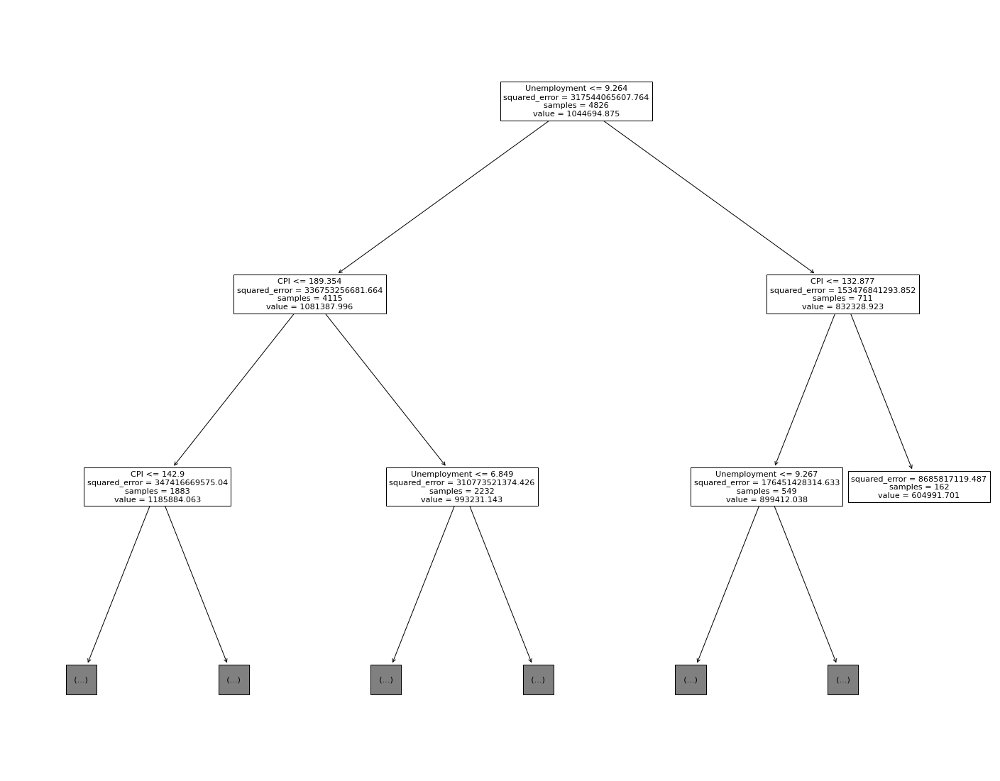

In [7]:
#from matplotlib import pyplot as plt # --ALREADY DONE UPFRONT (see top section "Setting Up the Workspace")

#declare the figure size parameters
fig = plt.figure(figsize=(25,20))
#use the tree.plot_tree() function to display the tree, setting parameter max_depth=2
_ = tree.plot_tree(walmart_model, feature_names=X.columns,max_depth=2)

## Full Decision Tree 

The plot below shows the entire decision. The labels are difficult to read, but the overall shape of the tree can be seen.

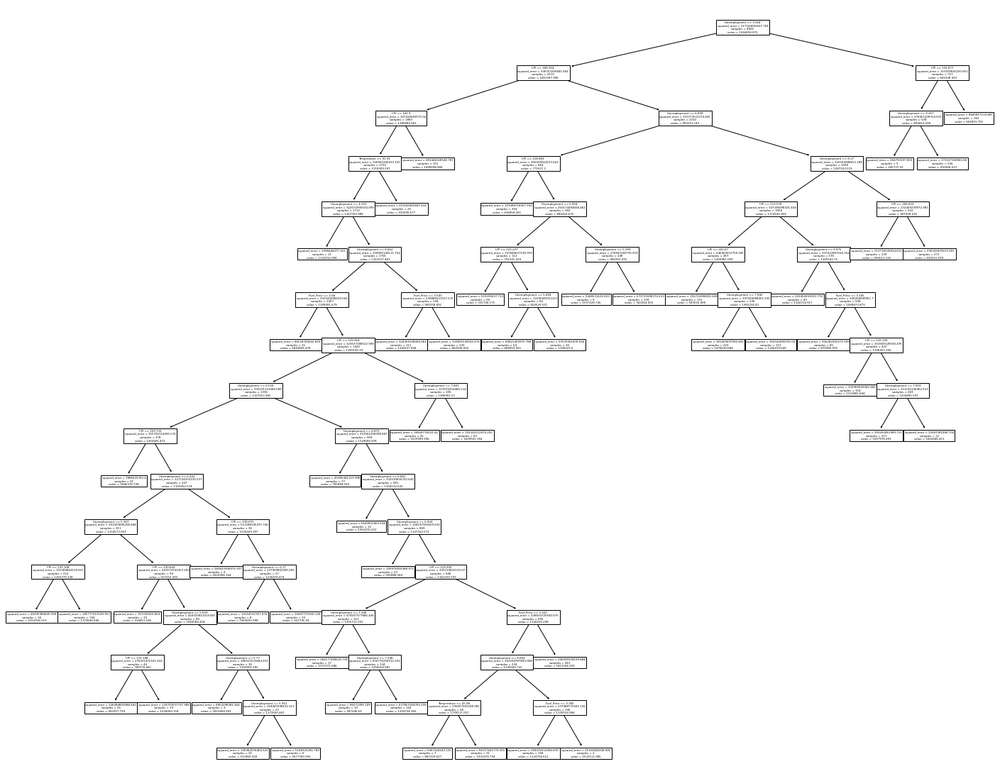

In [8]:
#declare the figure size parameters
fig = plt.figure(figsize=(25,20))
#use the tree.plot_tree() function to display the tree
_ = tree.plot_tree(walmart_model, feature_names=X.columns)

## Detailed Visualization of Splits

In [9]:
# import dtreeviz # --ALREADY DONE UPFRONT (see top section "Setting Up the Workspace")

#use the dtreeviz.model() function to create a detailed visualization of the splits in the decision tree
viz_model = dtreeviz.model(walmart_model,
                           feature_names=X.columns,
                           X_train=train_X, y_train=train_y)
#view the visualization at scale 0.8, so it fits on the screen
viz_model.view(scale=0.8)

c:\Users\erdug\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names


# 8. Introduction to Random Forests

Decision trees leave you with a difficult decision. A deep tree with lots of leaves will overfit because each prediction is coming from historical data from only the few houses at its leaf. But a shallow tree with few leaves will perform poorly because it fails to capture as many distinctions in the raw data.

Even today's most sophisticated modeling techniques face this tension between underfitting and overfitting. But, many models have clever ideas that can lead to better performance. We'll look at the **random forest** as an example.

The random forest uses many trees, and it makes a prediction by averaging the predictions of each component tree. It generally has much better predictive accuracy than a single decision tree and it works well with default parameters. If you keep modeling, you can learn more models with even better performance, but many of those are sensitive to getting the right parameters. 


## Random Forest Regression

You've already seen the code to load the data a few times. At the end of data-loading upfront near the top of this notebook (section "Loading the Data") we have the following variables:
- train_X
- val_X
- train_y
- val_y

We build a random forest model similarly to how we built a decision tree in scikit-learn - this time using the `RandomForestRegressor` class instead of `DecisionTreeRegressor`.

In [10]:
#from sklearn.ensemble import RandomForestRegressor # --ALREADY DONE UPFRONT (see top section "Setting Up the Workspace")
#from sklearn.metrics import mean_absolute_error # --ALREADY DONE UPFRONT (see top section "Setting Up the Workspace")

#declare the parameters of the random forest regressor model 
forest_model = RandomForestRegressor(random_state=1, max_leaf_nodes=50)
#fit the model using the training data set
forest_model.fit(train_X, train_y)
#predict sales using the validation data set
sales_preds = forest_model.predict(val_X)
#print the mean absolute error between the actual sales and the predicted sales in the validation data
print(mean_absolute_error(val_y, sales_preds))

    

385065.7341750314


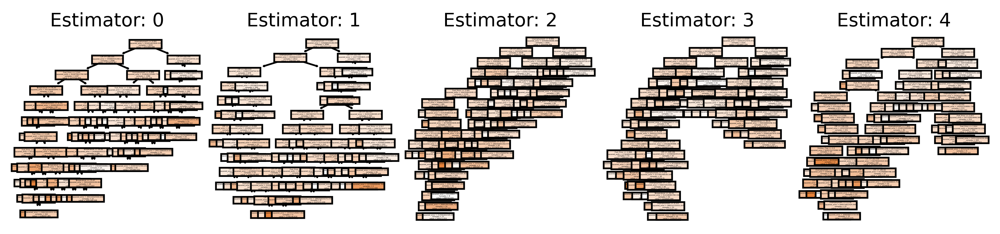

In [11]:
# This may not the best way to view each estimator as it is small, but does show the shape of the trees
fn=train_X.columns
cn='weekly_sales'
fig, axes = plt.subplots(nrows = 1,ncols = 5,figsize = (10,2), dpi=400)
for index in range(0, 5):
    tree.plot_tree(forest_model.estimators_[index],
                   feature_names = fn, 
                   class_names=cn,
                   filled = True,
                   ax = axes[index]);

    axes[index].set_title('Estimator: ' + str(index), fontsize = 11)

## Summary 
There is likely room for further improvement, but this is a substantial improvement over the initial decision tree error with maximum 5 leaf nodes. There are parameters which allow you to change the performance of the Random Forest much as we changed the maximum depth of the single decision tree. But one of the best features of Random Forest models is that they generally work reasonably even without this tuning.

---
# 9. BONUS: Decision Tree Classification

Re-load the data, this time using a binary variable as the target: above or below the historical median sales

In [12]:
#import pandas as pd # --ALREADY DONE UPFRONT (see top section "Setting Up the Workspace")
    
# Load data
walmart_file_path = 'https://www.dropbox.com/s/ns7envvzoqyypui/Walmart_Store_sales.csv?dl=1'
walmart_data = pd.read_csv(walmart_file_path) 
# Filter rows with missing values
walmart_data = walmart_data.dropna(axis=0)
# Choose target and features
y = walmart_data.Weekly_Sales <= walmart_data.Weekly_Sales.median()
walmart_features = ['Fuel_Price', 'Unemployment', 'CPI', 'Temperature', 'Holiday_Flag']
X = walmart_data[walmart_features]

# from sklearn.model_selection import train_test_split # --ALREADY DONE UPFRONT (see top section "Setting Up the Workspace")

# Split data into training and validation data, for both features and target
# The split is based on a random number generator. 
# Supplying a numeric value to the random_state argument guarantees we get the same split every time we run this script.
train_X, val_X, train_y, val_y = train_test_split(X, y,random_state = 0)

In [13]:
#confirm that classes of the target y are balanced using the value_counts() function
y.value_counts()

True     3218
False    3217
Name: Weekly_Sales, dtype: int64

In [14]:
#from sklearn.tree import DecisionTreeClassifier # --ALREADY DONE UPFRONT (see top section "Setting Up the Workspace")
#from sklearn.model_selection import train_test_split # --ALREADY DONE UPFRONT (see top section "Setting Up the Workspace")
#from sklearn import metrics # --ALREADY DONE UPFRONT (see top section "Setting Up the Workspace")

#declare the parameters of the decision tree classifier model 
#fix max_leaf_nodes=50 for visualization
walmart_model = DecisionTreeClassifier(max_leaf_nodes=50)

#fit the model using the training data set
walmart_model = walmart_model.fit(train_X,train_y)

#predict sales using the validation data set
y_hat = walmart_model.predict(val_X)

#compute the r2 for the validation data
r2 = walmart_model.score(val_X, val_y)
#print the rounded value of r2 for the validation data
print('R2 is ', round(r2, 2))


R2 is  0.67


Model Accuracy: How often is the classifier correct?

In [15]:
#use the metrics.accuracy_score() function to print the accuracy of the actual sales relative to the predicted sales in the validation data
print("Accuracy:",metrics.accuracy_score(val_y, y_hat))

Accuracy: 0.6749533871970168


Generate the confusion matrix -- just like we did before in SCM.254 for classification with Logistic Regression!

In [16]:
cnf_matrix = metrics.confusion_matrix(val_y, y_hat)
cnf_matrix

array([[620, 188],
       [335, 466]], dtype=int64)

Visualize a heatmap of the confusion matrix -- just like we did before in SCM.254 for classification with Logistic Regression

Text(0.5, 257.44, 'Predicted label')

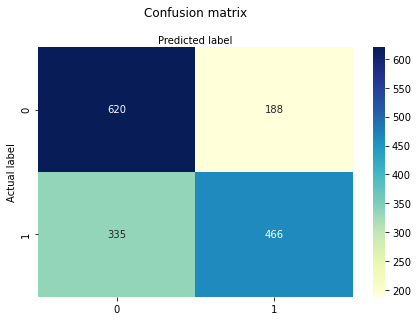

In [17]:
class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

Generate a classification report

In [18]:
#check the order that the classes are listed
walmart_model.classes_

array([False,  True])

In [19]:
# create a list of the labels to describe the classes in the report
target_labels = ['Above median weekly sales','Below median weekly sales']
print(classification_report(val_y, y_hat, target_names=target_labels)) # target_names is a parameter of the classification_report function

                           precision    recall  f1-score   support

Above median weekly sales       0.65      0.77      0.70       808
Below median weekly sales       0.71      0.58      0.64       801

                 accuracy                           0.67      1609
                macro avg       0.68      0.67      0.67      1609
             weighted avg       0.68      0.67      0.67      1609



We can plot the decision tree with matplotlib. The plot below is truncated to a maximum depth 2 for readability of first splits in the visualization.

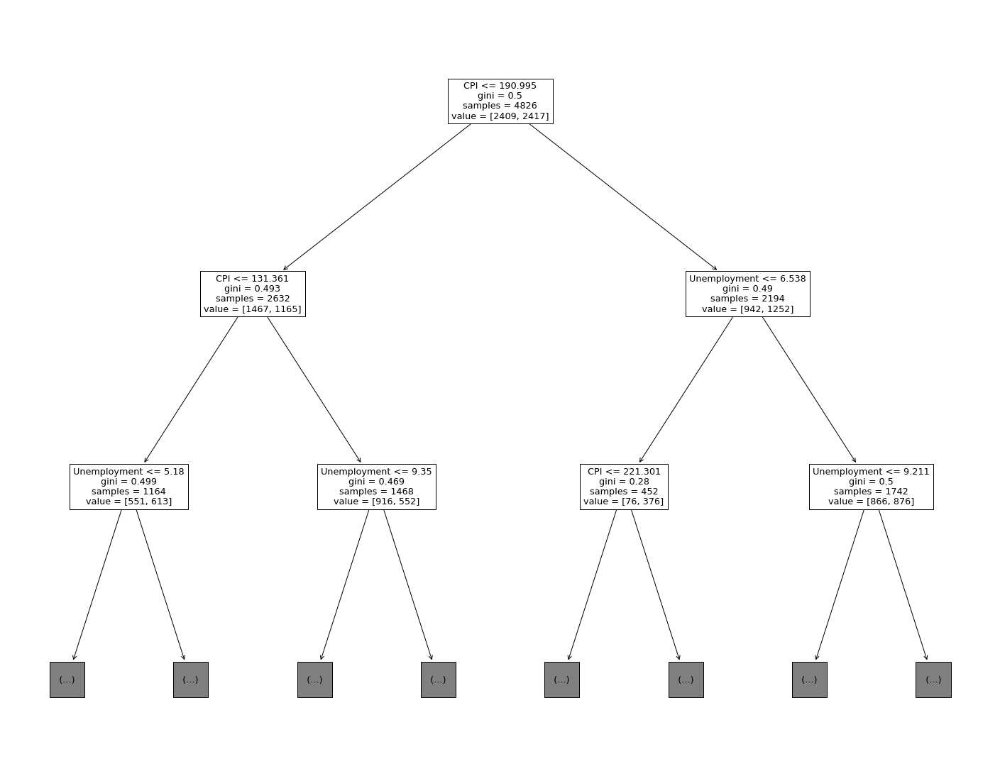

In [20]:
#from matplotlib import pyplot as plt # --ALREADY DONE UPFRONT (see top section "Setting Up the Workspace")

#declare the figure size parameters
fig = plt.figure(figsize=(25,20))
#use the tree.plot_tree() function to display the tree
_ = tree.plot_tree(walmart_model, feature_names=X.columns, max_depth=2)

Create a detailed visualization of the splits in the decision tree

c:\Users\erdug\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names


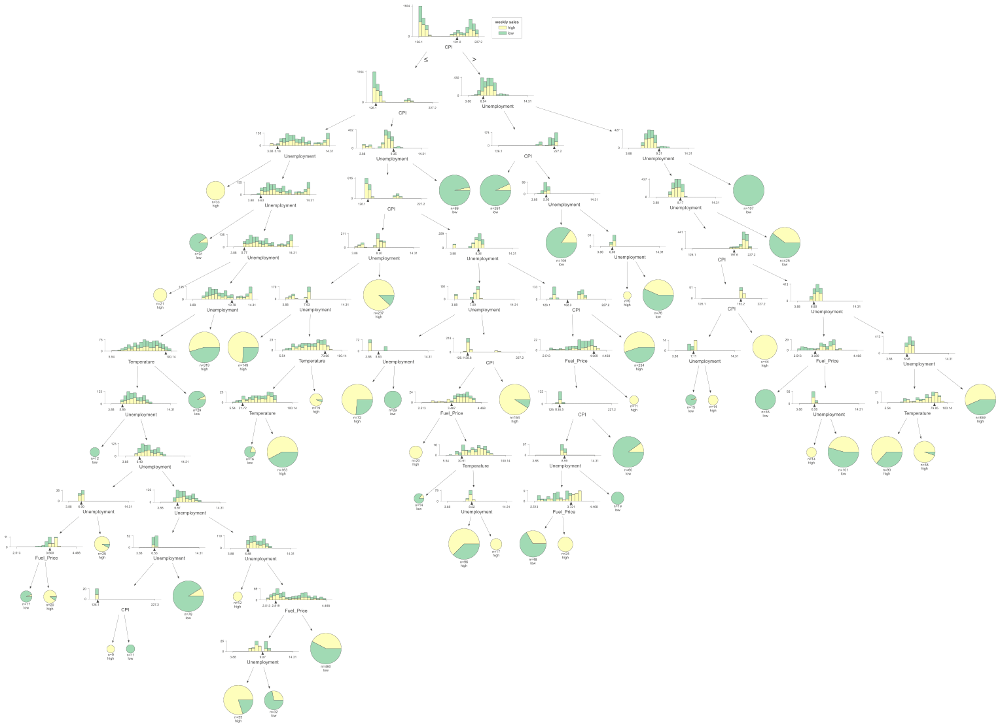

In [21]:
#import dtreeviz # --ALREADY DONE UPFRONT (see top section "Setting Up the Workspace")

#use the dtreeviz.model() function to create a detailed visualization of the splits in the decision tree
#for the classification problem we can visualize the classes of the target: in this case, high and low (above and below the median)
#the order of the parameters of the function doesn't matter as long as the keywords for parameters is used
viz_model = dtreeviz.model(walmart_model,
                           X_train=train_X, y_train=train_y,
                           feature_names=train_X.columns,
                           target_name='weekly sales', class_names=["high", "low"])
#view the visualization at scale 0.8, so it fits on the screen
viz_model.view(scale=0.8)

# 10. BONUS: Random Forest Classification

In [36]:
#import pandas as pd
#from sklearn.ensemble import RandomForestClassifier # --ALREADY DONE UPFRONT (see top section "Setting Up the Workspace")
#from sklearn import metrics # --ALREADY DONE UPFRONT (see top section "Setting Up the Workspace")

#declare the parameters of the random forest classifier model  
walmart_model = RandomForestClassifier(max_leaf_nodes=50, random_state=1)

#fit the model using the training data set
walmart_model.fit(train_X,train_y)

#predict sales using the validation data set
y_hat = walmart_model.predict(val_X)

#compute the r2 for the validation data
r2 = walmart_model.score(val_X, val_y)
#print the rounded value of r2 for the validation data
print('R2 is ', round(r2, 2))


R2 is  0.67


In [37]:
#use the metrics.accuracy_score() function to print the accuracy of the actual sales relative to the predicted sales in the validation data
print("Accuracy:",metrics.accuracy_score(val_y, y_hat))

Accuracy: 0.6693598508390305


In [38]:
cnf_matrix = metrics.confusion_matrix(val_y, y_hat)
cnf_matrix

array([[609, 199],
       [333, 468]], dtype=int64)

Text(0.5, 257.44, 'Predicted label')

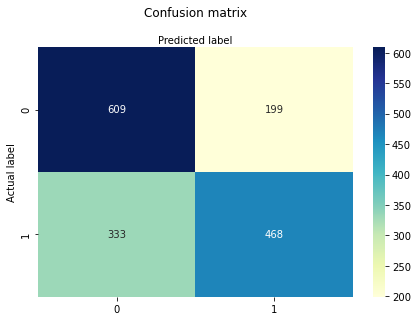

In [39]:
class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

In [40]:
# create a list of the labels to describe the classes in the report
target_labels = ['Above median weekly sales','Below median weekly sales']
print(classification_report(val_y, y_hat, target_names=target_labels)) # target_names is a parameter of the classification_report function

                           precision    recall  f1-score   support

Above median weekly sales       0.65      0.75      0.70       808
Below median weekly sales       0.70      0.58      0.64       801

                 accuracy                           0.67      1609
                macro avg       0.67      0.67      0.67      1609
             weighted avg       0.67      0.67      0.67      1609



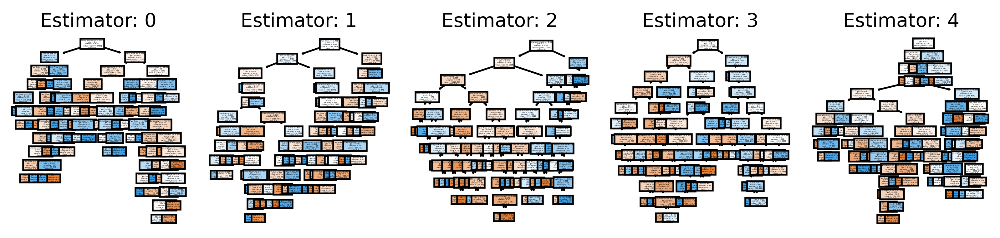

In [41]:
# This may not the best way to view each estimator as it is small
fn=train_X.columns
cn='weekly_sales'
fig, axes = plt.subplots(nrows = 1,ncols = 5,figsize = (10,2), dpi=400)
for index in range(0, 5):
    tree.plot_tree(walmart_model.estimators_[index],
                   feature_names = fn, 
                   class_names=cn,
                   filled = True,
                   ax = axes[index]);

    axes[index].set_title('Estimator: ' + str(index), fontsize = 11)